In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [ ]:
from timm import create_model

In [ ]:
from fastai.vision.all import *

In [ ]:
set_seed(999, reproducible=True)
BATCH_SIZE = 8

In [ ]:
dataset_path = Path('../datasets/kaggle/petfinder/')
dataset_path.ls()

(#10) [Path('../datasets/kaggle/petfinder/train_5folds.csv'),Path('../datasets/kaggle/petfinder/train_10folds.csv'),Path('../datasets/kaggle/petfinder/test.csv'),Path('../datasets/kaggle/petfinder/train.csv'),Path('../datasets/kaggle/petfinder/test'),Path('../datasets/kaggle/petfinder/sample_submission.csv'),Path('../datasets/kaggle/petfinder/archive.zip'),Path('../datasets/kaggle/petfinder/train'),Path('../datasets/kaggle/petfinder/crop'),Path('../datasets/kaggle/petfinder/petfinder-pawpularity-score.zip')]

In [ ]:
df = pd.read_csv(dataset_path/'train.csv')
df.head()

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72


In [ ]:
df['path'] = df['Id'].map(lambda x:str(dataset_path/'train'/x)+'.jpg')
df = df.sample(frac=1).reset_index(drop=True) #shuffle dataframe
df.head()

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity,path
0,ebaaa8e384b3d2f0a56c7ff7675c154c,0,0,1,1,0,0,0,0,0,0,0,1,50,../datasets/kaggle/petfinder/train/ebaaa8e384b3d2f0a56c7ff7675c154c.jpg
1,25e3bf4267c2dc3f579b779418221bb7,0,1,1,1,0,1,0,1,0,0,1,0,25,../datasets/kaggle/petfinder/train/25e3bf4267c2dc3f579b779418221bb7.jpg
2,6548166fb3fda22b67881176397f0223,0,0,1,1,0,1,0,0,0,0,0,0,27,../datasets/kaggle/petfinder/train/6548166fb3fda22b67881176397f0223.jpg
3,472c40116e1833555715e4774445ae5b,0,1,1,1,0,0,0,0,1,1,0,0,19,../datasets/kaggle/petfinder/train/472c40116e1833555715e4774445ae5b.jpg
4,7b77e1a6d93667b575d57db83facd860,0,1,1,1,0,0,0,1,0,0,0,0,27,../datasets/kaggle/petfinder/train/7b77e1a6d93667b575d57db83facd860.jpg


In [ ]:
len_df = len(df)
print(f"There are {len_df} images")

There are 9912 images


The mean Pawpularity score is 38.03904358353511
The median Pawpularity score is 33.0
The standard deviation of the Pawpularity score is 20.59199010577444


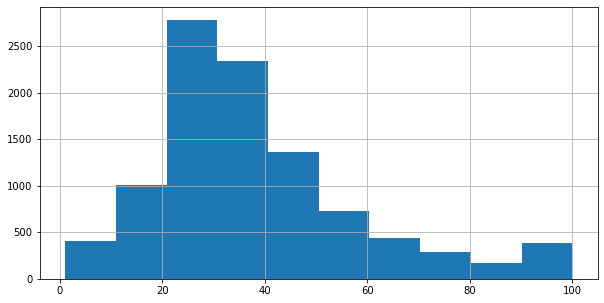

In [ ]:
df['Pawpularity'].hist(figsize = (10, 5))
print(f"The mean Pawpularity score is {df['Pawpularity'].mean()}")
print(f"The median Pawpularity score is {df['Pawpularity'].median()}")
print(f"The standard deviation of the Pawpularity score is {df['Pawpularity'].std()}")

In [ ]:
df['norm_score'] = df['Pawpularity']/100
df['norm_score']

0       0.50
1       0.25
2       0.27
3       0.19
4       0.27
        ... 
9907    0.26
9908    0.65
9909    0.38
9910    0.44
9911    0.62
Name: norm_score, Length: 9912, dtype: float64

In [ ]:
seed=999
set_seed(seed, reproducible=True)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.use_deterministic_algorithms = True

In [ ]:
#Sturges' rule
num_bins = int(np.floor(1+(3.3)*(np.log2(len(df)))))
# num_bins

<AxesSubplot:>

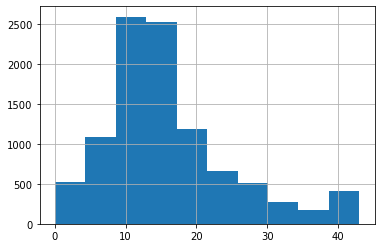

In [ ]:
df['bins'] = pd.cut(df['norm_score'], bins=num_bins, labels=False)
df['bins'].hist()

In [ ]:
import torch
import torch.nn as nn

# class PetModel(nn.Module):
#     def __init__(
#         self,
#         num_classes
#     ):
#         super().__init__()
#         self.swin = create_model('swin_large_patch4_window7_224', num_classes=0, pretrained=True)
#         self.res2next = create_model('res2next50', num_classes=0, pretrained=True)
        
#         self.dropout = nn.Dropout(0.5)
#         self.dense1 = nn.Linear(self.swin.num_features + self.res2next.num_features, 128)
#         self.gelu = nn.GELU()
#         self.dense2 = nn.Linear(128, 1)

#     def forward(self, x):
#         swin_features = self.swin(x)
#         res2next_features = self.res2next(x)
#         features = torch.cat([swin_features, res2next_features], dim=1)
#         out = self.dense1(self.dropout(features))
#         out = self.gelu(out)
#         pred = self.dense2(out)
#         return pred

# class PetModelForCB(nn.Module):
#     def __init__(
#         self,
#         num_classes
#     ):
#         super().__init__()
#         self.swin = create_model('swin_large_patch4_window7_224', num_classes=0, pretrained=True)
#         self.res2next = create_model('res2next50', num_classes=0, pretrained=True)
        
#         self.dropout = nn.Dropout(0.5)
#         self.dense1 = nn.Linear(self.swin.num_features + self.res2next.num_features, 128)
#         self.gelu = nn.GELU()
#         self.dense2 = nn.Linear(128, 1)
        
#     def forward(self, x):
#         swin_features = self.swin(x)
#         res2next_features = self.res2next(x)
#         features = torch.cat([swin_features, res2next_features], dim=1)
#         out = self.dense1(self.dropout(features))
#         out = self.gelu(out)
#         pred = self.dense2(out)
#         out = torch.cat([pred, features], dim=1)
#        return out

class PetModel(nn.Module):
    def __init__(
        self,
        num_classes
    ):
        super().__init__()
        self.model = create_model('swin_large_patch4_window7_224', num_classes=num_classes, pretrained=True)

    def forward(self, x):
        features = self.model.forward_features(x)
        pred = self.model.head(features)
        return pred

class PetModelForCB(nn.Module):
    def __init__(
        self,
        num_classes
    ):
        super().__init__()
        self.model = create_model('swin_large_patch4_window7_224', num_classes=num_classes, pretrained=True)

    def forward(self, x):
        features = self.model.forward_features(x)
        pred = self.model.head(features)
        out = torch.cat([pred, features], dim=1)
        return out



# class PetModel(nn.Module):
#     def __init__(
#         self,
#         num_classes
#     ):
#         super().__init__()
#         self.model = create_model('tf_efficientnet_b0', num_classes=num_classes, pretrained=False)

#     def forward(self, x):
#         x = self.model.forward_features(x)
#         x = self.model.global_pool(x)
#         if self.model.drop_rate > 0.:
#             x = F.dropout(x, p=self.model.drop_rate, training=self.model.training)
#         return self.model.classifier(x)

# class PetModelForCB(nn.Module):
#     def __init__(
#         self,
#         num_classes
#     ):
#         super().__init__()
#         self.model = create_model('tf_efficientnet_b0', num_classes=num_classes, pretrained=False)

#     def forward(self, x):
#         self.eval()
#         features = self.model.forward_features(x)
#         features = self.model.global_pool(features)
#         if self.model.drop_rate > 0.:
#             features = F.dropout(features, p=self.model.drop_rate, training=self.model.training)
#         pred = self.model.classifier(features)
#         out = torch.cat([pred, features], dim=1)
#         return out

In [ ]:
def petfinder_rmse(input,target):
    return 100*torch.sqrt(F.mse_loss(F.sigmoid(input.flatten()), target))

In [ ]:
import gc
import torch
from sklearn.model_selection import KFold
from  sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVR

def sigmoid(x):
    return 1 / (1 + math.exp(-x))

df['fold'] = -1

super_final_predictions = []
super_final_predictions2 = []
super_final_oof_predictions = []
super_final_oof_predictions2 = []
super_final_oof_true = []


N_FOLDS = 32
strat_kfold = StratifiedKFold(n_splits=N_FOLDS, random_state=seed, shuffle=True)
for fold, (idx, val_idx) in enumerate(strat_kfold.split(df.index, df['bins'])):
    name = f"SVR_fold_{fold}.pkl"
    train_df = df.loc[idx].reset_index(drop=True)
    val_df = df.loc[val_idx].reset_index(drop=True)

    dls = ImageDataLoaders.from_df(train_df, #pass in train DataFrame
                               valid_pct=0.2, #80-20 train-validation random split
                               seed=999, #seed
                               fn_col='path', #filename/path is in the second column of the DataFrame
                               label_col='norm_score', #label is in the first column of the DataFrame
                               y_block=RegressionBlock, #The type of target
                               bs=BATCH_SIZE, #pass in batch size
                               num_workers=8,
                               item_tfms=Resize(224), #pass in item_tfms
                               batch_tfms=setup_aug_tfms([Brightness(), Contrast(), Hue(), Saturation()])) #pass in batch_tfms

    model = PetModelForCB(num_classes=1)

    learn = Learner(
        dls, 
        model, 
        loss_func=BCEWithLogitsLossFlat(), 
        metrics=petfinder_rmse,
        # model_dir = "tf_efficientnet_b0"
        model_dir = "swin_large_patch4_window7_224_bs8_32fold_nomixup"
        # model_dir = "hybrid_bs8_20fold"
    ).to_fp16()
    # learn.load(f'tf_efficientnet_b0_fold{fold}')
    learn.load(f'swin_large_patch4_window7_224_fold{fold}')


    val_dl = dls.test_dl(val_df)

    val_preds, _ = learn.tta(dl=val_dl, n=5, beta=0)
    # val_preds, _ = learn.get_preds(dl=val_dl)
    val_preds = val_preds.cpu().detach().numpy()
    
    final_test_predictions = []
    final_test_predictions.extend(val_preds[:,:1].ravel().tolist())
    
    final_test_predictions = [x * 100 for x in final_test_predictions]
    super_final_predictions.append(final_test_predictions)
    
    
    final_oof_true = val_df['Pawpularity'].values
    super_final_oof_true.append(final_oof_true)

    ##################
    # COMPUTE RSME
    rsme = np.sqrt(np.mean((super_final_oof_true[-1] - np.array(super_final_predictions[-1]))**2.0))
    print('NN RSME =',rsme,'\n')



gc.collect()
torch.cuda.empty_cache()
    

/opt/conda/envs/rapids/lib/python3.7/site-packages/sklearn/model_selection/_split.py:668: UserWarning: The least populated class in y has only 20 members, which is less than n_splits=32.
  % (min_groups, self.n_splits)), UserWarning)
/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 16.93121591556267 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.365966650895075 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.23212266509855 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.73068722132986 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 16.456466303528046 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.251542772895167 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.107001776688666 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.03701053089561 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 16.641030416231843 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.700561964067433 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.257158071526668 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.952938777132445 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.207982377100414 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 16.1440184512178 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.76740704419055 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.514816934830325 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.978308100964274 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 16.436577282546754 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.183583192400963 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.65489923280214 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.130945049857793 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.682816768182477 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.321421062994336 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.875951522415168 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.027716319491503 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.806865060148727 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.288909286934743 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.037934284137258 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 16.531731033249244 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 16.940376166104382 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 17.222121588237 



/opt/conda/envs/rapids/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


NN RSME = 18.16942905191317 



In [ ]:
true = np.hstack(super_final_oof_true)

oof = np.hstack(super_final_predictions)
rsme = np.sqrt( np.mean( (oof - true)**2.0 ))
print('Overall CV NN head RSME =',rsme)

Overall CV NN head RSME = 17.531288616640417


In [ ]:
test_df = val_df
super_final_predictions = np.mean(np.column_stack(super_final_predictions), axis=1)
# super_final_predictions2 = np.mean(np.column_stack(super_final_predictions2), axis=1)
# test_df["Pawpularity"] = (1-best_w)*super_final_predictions + best_w*super_final_predictions2
test_df["Pawpularity"] = super_final_predictions
test_df = test_df[["Id", "Pawpularity"]]
test_df.to_csv("submission.csv", index=False)
test_df.head()

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 310 and the array at index 24 has size 309

In [ ]:
import torch
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
super_final_predictions = np.mean(np.column_stack(super_final_oof_true), axis=1)
print(len(super_final_predictions))
print(len(super_final_oof_true))

In [ ]:
from PIL import Image
from matplotlib import pyplot as plt
cnt = 0
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))
labels = []
preds = []
rmse_thr = 20
for i, (pred, true) in enumerate(zip(super_final_predictions, super_final_oof_true[0])):
    preds.append(pred)
    labels.append(true)
    # if np.sqrt(np.mean((pred - true)**2.0)) > rmse_thr:
    #     # x = cnt // 4
    #     # y = cnt % 4
    #     # ax = axs[x, y]
    #     # ax.axis("off")
    #     # img = Image.open(val_df['path'].values[i])
    #     # ax.set_title(f"pred: {pred:2f}, true: {true}")
    #     # print(f"pred: {pred:2f}, true: {true}")
    #     # ax.imshow(img)
    #     labels.append(true)
    #     cnt += 1
plt.show()
print(cnt)

In [ ]:
print(labels)
plt.title(f"RMSE: {rmse_thr}")
plt.hist(labels)

In [ ]:
plt.title("preds dist")
plt.hist(preds, range=(10, 90))

In [ ]:
plt.title("labels dist")
plt.hist(labels, range=(10, 90))